<a href="https://colab.research.google.com/github/jesus-tomas-girones/Mask_Detect/blob/main/6cat_val_InceptionV3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
FOLDER = '6cat_val'
!wget "http://mmoviles.upv.es/mascarillas/{FOLDER}.zip"
!unzip -qq -n {FOLDER}.zip

--2021-06-17 22:16:30--  http://mmoviles.upv.es/mascarillas/6cat_val.zip
Resolving mmoviles.upv.es (mmoviles.upv.es)... 158.42.250.56
Connecting to mmoviles.upv.es (mmoviles.upv.es)|158.42.250.56|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 31735949 (30M) [application/zip]
Saving to: ‘6cat_val.zip’

6cat_val.zip        100%[===================>]  30.27M  1.69MB/s    in 21s     

2021-06-17 22:16:52 (1.43 MB/s) - ‘6cat_val.zip’ saved [31735949/31735949]



In [ ]:
from keras_preprocessing.image import ImageDataGenerator

BATCH_SIZE = 33
IMG_SIZE = (224, 224)

training_datagen = ImageDataGenerator(
      rescale = 1./255,
      rotation_range=5,
      horizontal_flip=True)      
train_generator = training_datagen.flow_from_directory(
	   FOLDER+'/training',
     batch_size=BATCH_SIZE,
     seed=9,
	   target_size=IMG_SIZE)

validation_datagen = ImageDataGenerator(
      rescale = 1./255)
validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+'/validation/',
    batch_size=BATCH_SIZE,
	  target_size=IMG_SIZE,
    shuffle=False,
    seed=9) 

Found 1000 images belonging to 6 classes.
Found 194 images belonging to 6 classes.


In [ ]:
from tensorflow import keras

base_model = keras.applications.InceptionV3(
    weights="imagenet",  # Load weights pre-trained on ImageNet.
    input_shape=IMG_SIZE+(3,),
    include_top=False, # Do not include the ImageNet classifier at the top.
)  
base_model.trainable = False # Freeze the base_model

inputs = keras.Input(shape=IMG_SIZE+(3,))
x = inputs
x = base_model(x, training=False)
#x = keras.layers.GlobalAveragePooling2D()(x)
x = keras.layers.Flatten()(x)
x = keras.layers.Dense(512)(x)
x = keras.layers.Dropout(0.2)(x)  # Regularize with dropout
outputs = keras.layers.Dense(6, activation="softmax")(x)
model = keras.Model(inputs, outputs)

model.summary()

87916544/87910968 [==============================] - 2s 0us/step
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
inception_v3 (Functional)    (None, 5, 5, 2048)        21802784  
_________________________________________________________________
flatten (Flatten)            (None, 51200)             0         
_________________________________________________________________
dense (Dense)                (None, 512)               26214912  
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 6)                 3078      
Total params: 48,020,774
Trainable params: 26,217,990
Non-trai

In [ ]:
EPOCHS = 20
INIT_LR = 1e-4
model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)

Epoch 1/20
31/31 [==============================] - 32s 406ms/step - loss: 8.2254 - accuracy: 0.5650 - val_loss: 4.0861 - val_accuracy: 0.6186
Epoch 2/20
31/31 [==============================] - 11s 356ms/step - loss: 2.1806 - accuracy: 0.7300 - val_loss: 3.2387 - val_accuracy: 0.5361
Epoch 3/20
31/31 [==============================] - 11s 359ms/step - loss: 2.6321 - accuracy: 0.7090 - val_loss: 3.4728 - val_accuracy: 0.7216
Epoch 4/20
31/31 [==============================] - 11s 352ms/step - loss: 2.0808 - accuracy: 0.7650 - val_loss: 4.5340 - val_accuracy: 0.5722
Epoch 5/20
31/31 [==============================] - 11s 355ms/step - loss: 1.7565 - accuracy: 0.7900 - val_loss: 2.8844 - val_accuracy: 0.6753
Epoch 6/20
31/31 [==============================] - 11s 355ms/step - loss: 1.0133 - accuracy: 0.8590 - val_loss: 2.2217 - val_accuracy: 0.7423
Epoch 7/20
31/31 [==============================] - 11s 356ms/step - loss: 0.7773 - accuracy: 0.8750 - val_loss: 3.0129 - val_accuracy: 0.6546

In [ ]:
base_model.trainable = True

EPOCHS = 20
INIT_LR = 1e-5

model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=INIT_LR, 
        decay=INIT_LR / EPOCHS),
    loss=keras.losses.categorical_crossentropy,
    metrics=["accuracy"],
)
H2 = model.fit(
    train_generator, 
    epochs=EPOCHS, 
    batch_size = BATCH_SIZE,
    validation_data=validation_generator,
    validation_batch_size = BATCH_SIZE,
)
#Concatenamos historia de entrenamiento
H.history['loss'] = H.history['loss'] + H2.history['loss']
H.history['accuracy'] = H.history['accuracy'] + H2.history['accuracy']
H.history['val_loss'] = H.history['val_loss'] + H2.history['val_loss']
H.history['val_accuracy'] = H.history['val_accuracy'] + H2.history['val_accuracy']

Epoch 1/20
31/31 [==============================] - 21s 430ms/step - loss: 0.3341 - accuracy: 0.9340 - val_loss: 3.0026 - val_accuracy: 0.7165
Epoch 2/20
31/31 [==============================] - 12s 385ms/step - loss: 0.2884 - accuracy: 0.9490 - val_loss: 2.4807 - val_accuracy: 0.7423
Epoch 3/20
31/31 [==============================] - 12s 384ms/step - loss: 0.1117 - accuracy: 0.9750 - val_loss: 2.3674 - val_accuracy: 0.7680
Epoch 4/20
31/31 [==============================] - 12s 381ms/step - loss: 0.0690 - accuracy: 0.9830 - val_loss: 2.6294 - val_accuracy: 0.7423
Epoch 5/20
31/31 [==============================] - 12s 379ms/step - loss: 0.0668 - accuracy: 0.9820 - val_loss: 2.4697 - val_accuracy: 0.7371
Epoch 6/20
31/31 [==============================] - 12s 384ms/step - loss: 0.1191 - accuracy: 0.9760 - val_loss: 2.1365 - val_accuracy: 0.7423
Epoch 7/20
31/31 [==============================] - 12s 379ms/step - loss: 0.0989 - accuracy: 0.9770 - val_loss: 2.7137 - val_accuracy: 0.7371

acc:  [0.5649999976158142, 0.7300000190734863, 0.7089999914169312, 0.7649999856948853, 0.7900000214576721, 0.859000027179718, 0.875, 0.8510000109672546, 0.8569999933242798, 0.8519999980926514, 0.8930000066757202, 0.9070000052452087, 0.9200000166893005, 0.9279999732971191, 0.9269999861717224, 0.9359999895095825, 0.9419999718666077, 0.9129999876022339, 0.9160000085830688, 0.9190000295639038, 0.9340000152587891, 0.9490000009536743, 0.9750000238418579, 0.9829999804496765, 0.9819999933242798, 0.9760000109672546, 0.9769999980926514, 0.9750000238418579, 0.9869999885559082, 0.9879999756813049, 0.9819999933242798, 0.9860000014305115, 0.9950000047683716, 0.9919999837875366, 0.9950000047683716, 0.996999979019165, 0.9929999709129333, 0.996999979019165, 0.996999979019165, 0.9980000257492065]
val_acc:  [0.6185566782951355, 0.5360824465751648, 0.7216494679450989, 0.5721649527549744, 0.6752577424049377, 0.7422680258750916, 0.6546391844749451, 0.7113401889801025, 0.7216494679450989, 0.6804123520851135,

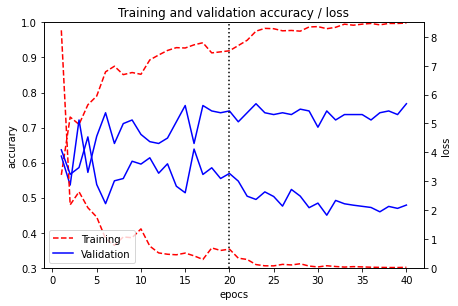

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  loss = history.history['loss']
  val_loss = history.history['val_loss']
  epochs = range(1, len(acc)+1)
  print("acc: ", acc)
  print("val_acc: ", val_acc)
  print("loss: ", loss)
  print("val_loss: ", val_loss)
  
  fig, ax1 = plt.subplots()
  fig.tight_layout()  # otherwise the right y-label is slightly clipped
  ax1.axis(ymin=0.3, ymax=1.0)
  ax1.set_xlabel('epocs')
  ax1.set_ylabel('accurary')
  ax1.plot(epochs, acc, 'r--', label='Training accuracy')
  ax1.plot(epochs, val_acc, 'b', label='Validation accuracy')
  ax2 = ax1.twinx() 
  ax2.set_ylabel('loss')
  ax2.axis(ymin=0.0, ymax=8.5)
  ax2.plot(epochs, loss, 'r--', label='Training')
  ax2.plot(epochs, val_loss, 'b', label='Validation')
  plt.title('Training and validation accuracy / loss')
  plt.legend(loc="lower left")#"best")#0
  plt.axvline(x=20, color='k', linestyle='dotted')
  plt.show()

show_accuracy(H)

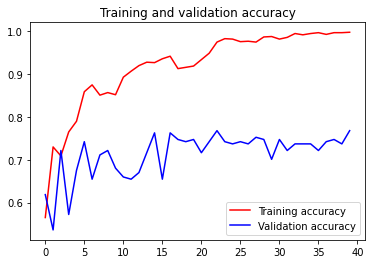

<Figure size 432x288 with 0 Axes>

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

import matplotlib.pyplot as plt

def show_accuracy2(history):
  acc = history.history['accuracy']
  val_acc = history.history['val_accuracy']
  #loss = history.history['loss']
  #val_loss = history.history['val_loss']
  epochs = range(len(acc))
  plt.plot(epochs, acc, 'r', label='Training accuracy')
  plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.legend(loc=0)
  plt.figure()
  plt.show()

show_accuracy2(H)

              precision    recall  f1-score   support

     GLASSES       0.50      0.11      0.18         9
    SIDE FIT       0.67      0.18      0.29        11
    NOSE OUT       0.77      0.86      0.81        28
          OK       0.78      0.87      0.82        89
    N.BRIDGE       0.60      0.66      0.63        32
     WITHOUT       1.00      0.96      0.98        25

    accuracy                           0.77       194
   macro avg       0.72      0.61      0.62       194
weighted avg       0.76      0.77      0.75       194



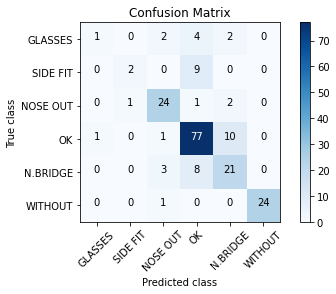

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import itertools
import numpy as np

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""
validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

Found 194 images belonging to 6 classes.


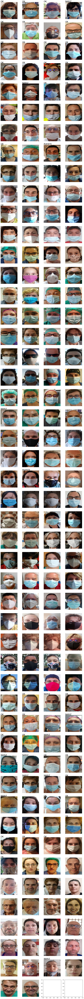

accuracy:  145 / 194  =  0.7474226804123711


In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }
import numpy as np
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator

NCOLS = 4 # número de columnas

#Visualiza los pimeros <number> imagenes, generadas desde datagen
#se clasifica cada imagen y en caso de error, se muestra la categoría asignada 
def show_generate_images(datagen, sample_number=None):
   if not isinstance(sample_number, (int) ): # Si no se indican cuantas 
      sample_number = datagen.samples        # se visualizan todas
   target_names = []                 # Obtenemos nombres de las clases 
   for key in datagen.class_indices:
      target_names.append(key)  
   nrows = -(-sample_number//NCOLS)  # número de filas (división entera redondeando hacia arriba)
   fig, ax = plt.subplots(nrows=nrows, ncols=NCOLS, figsize=(4*NCOLS,4*nrows))
   errors = 0
   i = 0
   for b in range( -(-sample_number // datagen.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
      x,y = datagen.next()
      for j in range(len(x)):
         if (i < sample_number):
            col = i % NCOLS
            row = i // NCOLS
            ax[row,col].axis('Off')  
            ax[row,col].imshow(x[j])
            y_pred = model.predict(x)[j]  # Verificamos error
            cat = np.argmax(y[j])
            cat_pred = np.argmax(y_pred) 
            if cat != cat_pred :
                ax[row,col].text(0, 0, target_names[cat_pred], fontsize=22)
                errors +=1
            i += 1
   plt.show()
   print("accuracy: ", sample_number-errors,"/",sample_number," = ", (sample_number-errors)/sample_number ) 

validation_generator = validation_datagen.flow_from_directory(
	  FOLDER+"/validation/",
    batch_size=BATCH_SIZE,
	  target_size=(IMG_SIZE),
    shuffle=False)
validation_generator.reset()
show_generate_images(validation_generator)


acc:  [0.5109999775886536, 0.6439999938011169, 0.6679999828338623, 0.7089999914169312, 0.7149999737739563, 0.7360000014305115, 0.7450000047683716, 0.7609999775886536, 0.7710000276565552, 0.7670000195503235, 0.7850000262260437, 0.8130000233650208, 0.800000011920929, 0.800000011920929, 0.8019999861717224, 0.8059999942779541, 0.8220000267028809, 0.8259999752044678, 0.8270000219345093, 0.8209999799728394, 0.8259999752044678, 0.8989999890327454, 0.9259999990463257, 0.9509999752044678, 0.9610000252723694, 0.9679999947547913, 0.9810000061988831, 0.9850000143051147, 0.9900000095367432, 0.9900000095367432, 0.9929999709129333, 0.9919999837875366, 0.9980000257492065, 0.9950000047683716, 0.996999979019165, 1.0, 0.9980000257492065, 0.9959999918937683, 0.9929999709129333, 0.984000027179718]
val_acc:  [0.6030927896499634, 0.6701030731201172, 0.6907216310501099, 0.7113401889801025, 0.7319587469100952, 0.6958763003349304, 0.7268041372299194, 0.7371134161949158, 0.7010309100151062, 0.7422680258750916, 0

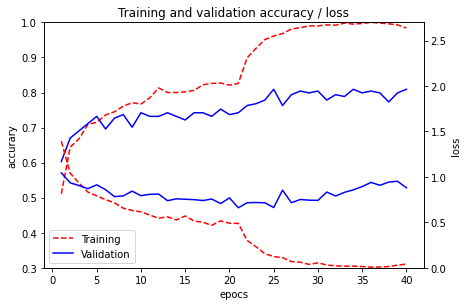

In [ ]:
show_accuracy(H)

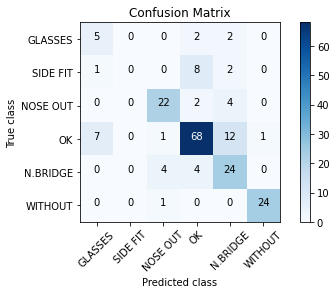

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from collections import Counter
from sklearn.metrics import confusion_matrix
import itertools
import numpy as np
from sklearn.metrics import classification_report

def plot_confusion_matrix(cm, classes_map,
                          normalize=False,
                          title='Confusion Matrix',
                          cmap=plt.cm.Blues):
    """
    Esta función visualiza la matriz de confusión.
    Usa el parámetro `normalize=True` para normalizar los resultados.
    Note, this code is taken straight from the SKLEARN website, an nice way of viewing confusion matrix.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes_map))
    inv_map = {v: k for k, v in classes_map.items()}
    labels = inv_map.values()
    plt.xticks(tick_marks, labels, rotation=45)
    plt.yticks(tick_marks, labels)
    if normalize:
        cm = np.around(cm.astype('float') / cm.sum(axis=1)[:, np.newaxis], 2)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True class')
    plt.xlabel('Predicted class')

"""
Obtener la matriz de confusión de un corpus creado desde un ImageDataGenerator 
es algo más complejo que el último ejemplo estudiado. El problema está en que las 
muestras son extraidas por lotes (bath) y la función 
confusion_matrix(validation_classes, y_pred) espera que sus dos parámetros sean 
vectores. Para resolverlo recorremos todos los lotes el generador y vamos 
concatenando los vectores adecuados.
Otra solución alternativa en:
https://stackoverflow.com/questions/47907061/how-to-get-confusion-matrix-when-using-model-fit-generator
"""

validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)

              precision    recall  f1-score   support

     GLASSES       0.75      0.33      0.46         9
    SIDE FIT       0.50      0.36      0.42        11
    NOSE OUT       0.89      0.89      0.89        28
          OK       0.82      0.90      0.86        89
    N.BRIDGE       0.66      0.66      0.66        32
     WITHOUT       1.00      0.96      0.98        25

    accuracy                           0.81       194
   macro avg       0.77      0.68      0.71       194
weighted avg       0.80      0.81      0.80       194



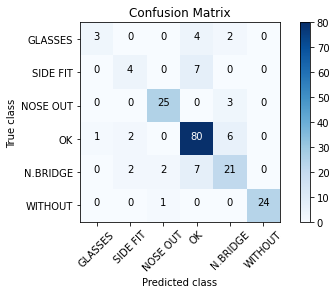

In [ ]:
#@title Doble clic para mostrar código. { display-mode: "form" }

from sklearn.metrics import classification_report

validation_classes = []
validation_images = []
for i in range( -(-validation_generator.samples // validation_generator.batch_size)):  # número de veces que podemos sacar batch redondeado hacia arriba
   batch = validation_generator.next()
   expected = np.argmax(batch[1], axis=1) 
   validation_classes.extend(expected)
   validation_images.extend(batch[0])
validation_classes = np.array(validation_classes)
validation_images = np.array(validation_images)
Y_pred = model.predict(validation_images)
y_pred = np.argmax(Y_pred, axis=1)


print(classification_report(validation_classes, y_pred, 
		target_names = ['GLASSES', 'SIDE FIT', 'NOSE OUT', 'OK', 'N.BRIDGE', 'WITHOUT']))

my_confussion = confusion_matrix(validation_classes, y_pred)
classes = {'GLASSES': 0, 'SIDE FIT': 1, 'NOSE OUT': 2, 'OK': 3, 'N.BRIDGE': 4, 'WITHOUT': 5}
plot_confusion_matrix(my_confussion, classes_map = classes)#validation_generator.class_indices)#, normalize=True)